In [ ]:
[Github](

Technological Institute of the Philippines | Quezon City - Computer Engineering
--- | ---
Course Code: | CPE 018
Code Title: | Emerging Technologies in CpE 1 - Fundamentals of Computer Vision
1st Semester | AY 2023-2024
<u>**ACTIVITY NO. 4** | **Edge and Contour Detection**
| **Name:** | Pascual, Ken Leonard |
| **Section:** | CPE31S3 |
| **Date Performed:** | 3 September 2025 |
| **Date Submitted:** | 3 September 2025 |
| **Instructor:** | Engr. Verlyn V. Nojor |

<hr>

## 1. Objectives

This activity aims tointroduce students to the use of OpenCV for edge detection and contour detection.

## 2. Intended Learning Outcomes (ILOs)
After this activity, the students should be able to:
* Explain fundamental idea of convolution and the kernel's importance.
* Use different image manipulation methods by using openCV functions.
* Perform contour and edge line drawing on their own images.

## 3. Procedures and Outputs

In [3]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
# This is the file URL: https://media.wired.com/photos/5cdefb92b86e041493d389df/4:3/w_1330,h_998,c_limit/Culture-Grumpy-Cat-487386121.jpg
src = cv2.imread('grumpycat.png')
dst = cv2.cvtColor(src, cv2.COLOR_BGR2GRAY)

Edges play a major role in both human and computer vision. We, as humans, can easily recognize many object types and their pose just by seeing a backlit silhouette or a rough sketch. Indeed, when art emphasizes edges and poses, it often seems to convey the idea of an archetype, such as Rodin's The Thinker or Joe Shuster's Superman.

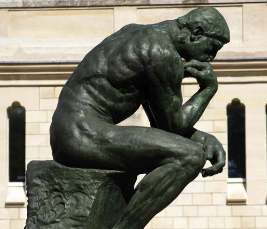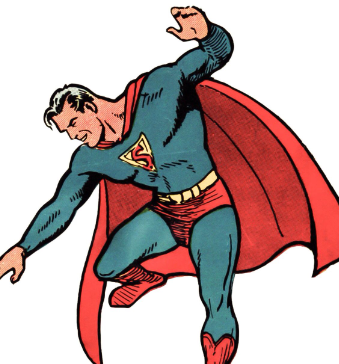

Software, too, can reason about edges, poses, and archetypes.

OpenCV provides many edge-finding filters, including Laplacian(), Sobel(), and Scharr(). These filters are supposed to turn non-edge regions to black while turning edge regions to white or saturated colors. However, they are prone to misidentifying noise as edges. This flaw can be mitigated by blurring an image before trying to find its edges. OpenCV also provides many blurring filters, including blur() (simple average), medianBlur(), and GaussianBlur(). The arguments for the edge-finding and blurring filters vary but always include ksize, an odd whole number that represents the width and height (in pixels) of a filter's kernel.

For blurring, let's use medianBlur(), which is effective in removing digital video noise, especially in color images. For edge-finding, let's use Laplacian(), which produces bold edge lines, especially in grayscale images. After applying medianBlur(), but before applying Laplacian(), we should convert the image from BGR to grayscale.

Once we have the result of Laplacian(), we can invert it to get black edges on a white background. Then, we can normalize it (so that its values range from 0 to 1) and multiply it with the source image to darken the edges. Let's implement this approach:

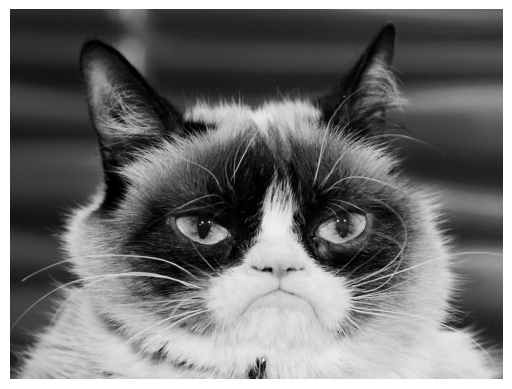

In [3]:
# Display grayscale image properly
plt.imshow(dst, cmap='gray')  # <-- IMPORTANT
plt.axis("off")
plt.show()

In [4]:
import cv2
import matplotlib.pyplot as plt

def strokeEdges(src, dst, blurKsize=7, edgeKsize=5):  # blurKsize should be odd
    # If blurKsize >= 3, apply median blur first
    if blurKsize >= 3:
        blurredSrc = cv2.medianBlur(src, blurKsize)
        graySrc = cv2.cvtColor(blurredSrc, cv2.COLOR_BGR2GRAY)
    else:
        graySrc = cv2.cvtColor(src, cv2.COLOR_BGR2GRAY)

    # Apply Laplacian edge detection (moved OUTSIDE the else block)
    cv2.Laplacian(graySrc, cv2.CV_8U, graySrc, ksize=edgeKsize)

    # Create inverted normalized alpha mask
    normalizedInverseAlpha = (1.0 / 255) * (255 - graySrc)

    # Split BGR channels and apply mask
    channels = cv2.split(src)
    for channel in channels:
        channel[:] = channel * normalizedInverseAlpha

    # Merge channels back into a color image
    return cv2.merge(channels, dst)

In [5]:
# Read input image
src = cv2.imread("files/grumpy-cat.png")
dst = src.copy()

**For the function above, provide an analysis:**
* Try to run the function and pass values for its parameters.
* Change the values in the kSize variables. What do you notice?

*Make sure to add codeblocks underneath this section to ensure that your demonstration of the procedure and answers are easily identifiable*

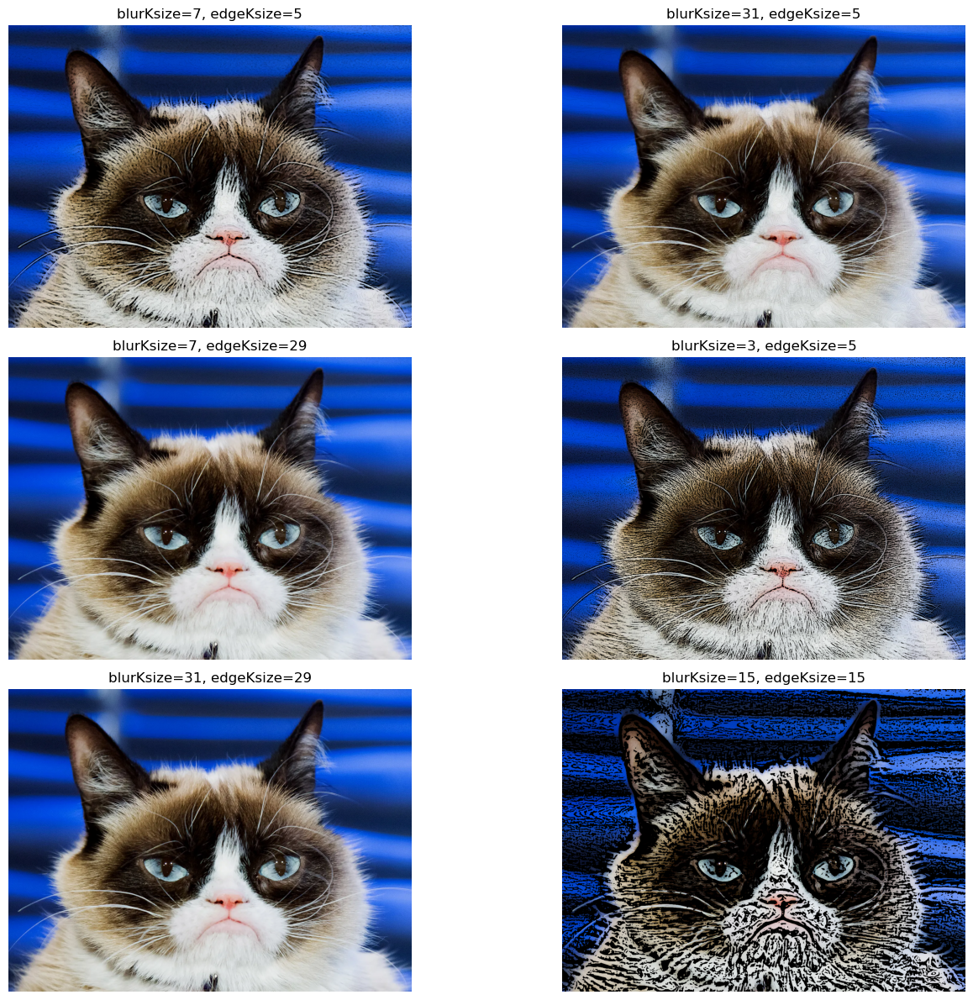

In [6]:
params = [
    (7, 5, "blurKsize=7, edgeKsize=5"),      # Default
    (31, 5, "blurKsize=31, edgeKsize=5"),    # High blurKsize
    (7, 29, "blurKsize=7, edgeKsize=29"),    # High edgeKsize
    (3, 5, "blurKsize=3, edgeKsize=5"),      # Low blurKsize
    (31, 29, "blurKsize=31, edgeKsize=29"),  # High blur + high edge
    (15, 15, "blurKsize=15, edgeKsize=15")   # Mid blur + mid edge
]

# Create figure for results
plt.figure(figsize=(15, 12))

for i, (blurKsize, edgeKsize, title) in enumerate(params, 1):
    # Apply strokeEdges
    result = strokeEdges(src, dst, blurKsize=blurKsize, edgeKsize=edgeKsize)
    result_rgb = cv2.cvtColor(result, cv2.COLOR_BGR2RGB)

    # Use a 3x2 grid to fit 6 images
    plt.subplot(3, 2, i)
    plt.imshow(result_rgb)
    plt.axis("off")
    plt.title(title)

plt.tight_layout()
plt.show()


*blurKsize determines how "smooth" the image is before edge detection by applying a median blur effect. On the other hand, edgeKsize determines the thickness and intensity of the edges detected in an image. So they work in a way wherein if blurKsize is changed, edgeKsize can potentially change too.*

*Changing the blurKsize would smoothen the edges in the image, but this also means that edgeKsize won't detect a lot of edges to work with. A middle value, however, would show what happends if there's just enough blur for edgeKsize to modify.*

<hr/>

### Custom Kernels -- Getting Convoluted

As we have just seen, many of OpenCV's predefined filters use a kernel. Remember that a kernel is a set of weights, which determine how each output pixel is calculated from a neighborhood of input pixels. Another term for a kernel is a convolution
matrix. It mixes up or convolves the pixels in a region. Similarly, a kernel-based filter may be called a convolution filter.

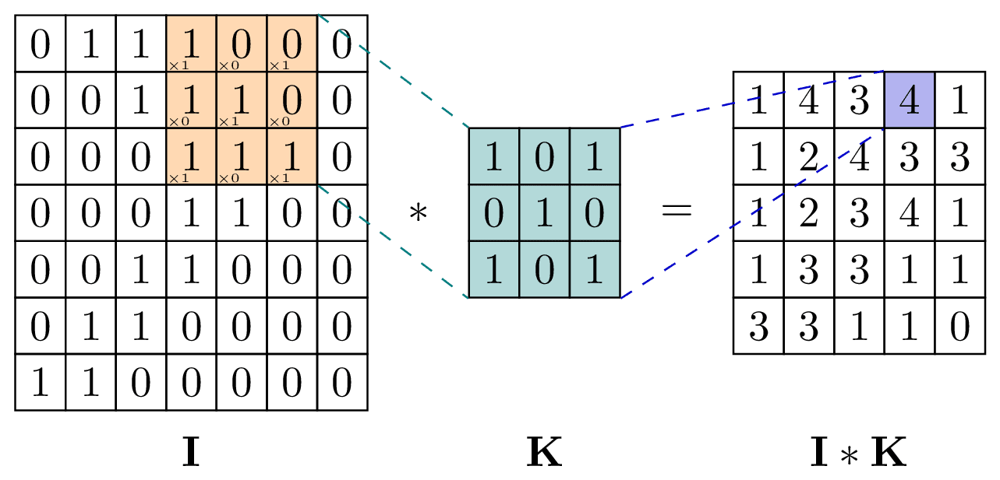

OpenCV provides a very versatile filter2D() function, which applies any kernel or convolution matrix that we specify. To understand how to use this function, let's first learn the format of a convolution matrix. It is a 2D array with an odd number of rows and columns. The central element corresponds to a pixel of interest and the other elements correspond to the neighbors of this pixel. Each element contains an integer or floating point value, which is a weight that gets applied to an input pixel's value.

In [37]:
import numpy as np
import matplotlib.pyplot as plt
# Define sharpening kernel
kernel = np.array([[-1, -1, -1],
                   [-1, 9, -1],
                   [-1, -1, -1]])

Here, the pixel of interest has a weight of 9 and its immediate neighbors each have a weight of -1. For the pixel of interest, the output color will be nine times
its input color minus the input colors of all eight adjacent pixels. If the pixel of interest is already a bit different from its neighbors, this difference becomes intensified. The effect is that the image looks sharper as the contrast between the neighbors is increased.

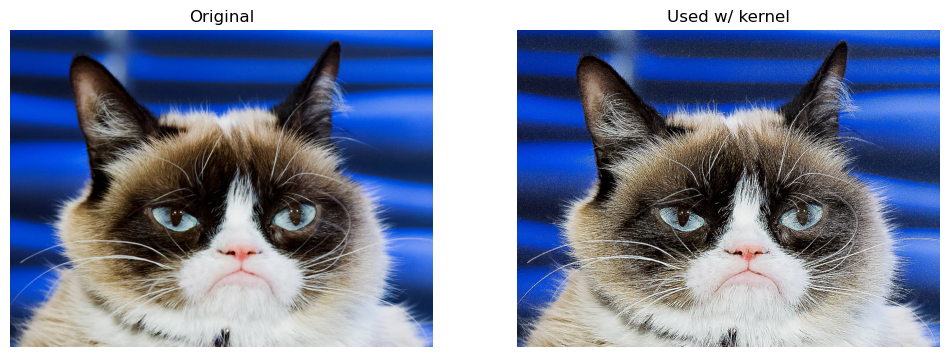

In [38]:
import cv2

# Load image
src = cv2.imread('grumpycat.png')

# Apply kernel to color image
new_img2 = cv2.filter2D(src, -1, kernel)

# Display results
# Convert BGR → RGB for Matplotlib
src_rgb = cv2.cvtColor(src, cv2.COLOR_BGR2RGB)
new_img2_rgb = cv2.cvtColor(new_img2, cv2.COLOR_BGR2RGB)

# Display images side by side
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.imshow(src_rgb)
plt.title("Original")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(new_img2_rgb)
plt.title("Used w/ kernel")
plt.axis("off")

plt.show()

**Answer the following with analysis**:
* What does filter2d() function do that resulted to this image above?
* Provide a comparison between this new image and the previous image that we were able to generate.

*filter2d() function applies a convolution between the image and the kernel array. Convolution works by multiplying the values of the array to corresponding values in the image's section, then finding the sum of that grid.*

*[This clip explains a bit more detail about convolution in image processing](https://youtu.be/KuXjwB4LzSA?si=QDBy1p__kY3CVMDK&t=539)*

<hr/>

Based on this simple example, let's add two classes. One class, VConvolutionFilter, will represent a convolution filter in general.
A subclass, SharpenFilter, will represent our sharpening filter specifically.

In [71]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

class VConvolutionFilter(object):
  """a filter that applies a convolution to V (or all of BGR)."""

  def __init__(self, kernel):
    self._kernel = kernel

  def apply(self, src, dst):
    """ Apply the filter with a BGR or gray source/destination """
    cv2.filter2D(src, -1, self._kernel, dst)

In [72]:
class SharpenFilter(VConvolutionFilter):
  """a sharpen filter with a 1-pixel radius."""

  def __init__(self):
    kernel = np.array([[-1, -1, -1],
                       [-1, 9, -1],
                       [-1, -1, -1]])
    VConvolutionFilter.__init__(self, kernel)

#### **Run the classes above, create objects and aim to show the output of the two classes. Afterwards, make sure to make an analysis of the output**.

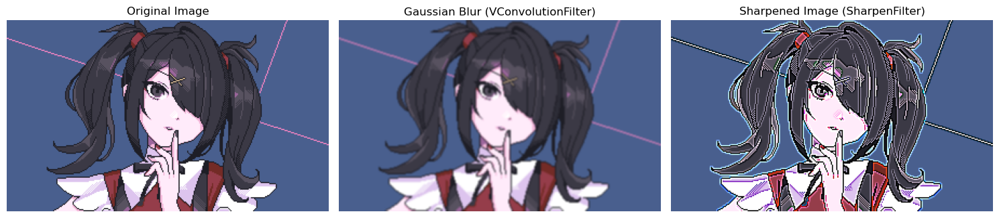

In [74]:
src = cv2.imread("Ame.png", cv2.IMREAD_COLOR)
src_rgb = cv2.cvtColor(src, cv2.COLOR_BGR2RGB)  # Convert for Matplotlib display

#VConvolutionFilter object with a Gaussian blur kernel
gaussian_kernel = np.array([[1, 2, 1],
                            [2, 4, 2],
                            [1, 2, 1]], dtype=np.float32)
gaussian_kernel /= gaussian_kernel.sum()  # Normalize kernel

gaussian_filter = VConvolutionFilter(gaussian_kernel)

#SharpenFilter object
sharpen_filter = SharpenFilter()

#Apply filters
blurred_img = src.copy()
gaussian_filter.apply(src, blurred_img)

sharpened_img = src.copy()
sharpen_filter.apply(src, sharpened_img)

#convert colors for matplotlib
blurred_rgb = cv2.cvtColor(blurred_img, cv2.COLOR_BGR2RGB)
sharpened_rgb = cv2.cvtColor(sharpened_img, cv2.COLOR_BGR2RGB)


#results
plt.figure(figsize=(15, 6))

plt.subplot(1, 3, 1)
plt.imshow(src_rgb)
plt.title("Original Image")
plt.axis("off")

plt.subplot(1, 3, 2)
plt.imshow(blurred_rgb)
plt.title("Gaussian Blur (VConvolutionFilter)")
plt.axis("off")

plt.subplot(1, 3, 3)
plt.imshow(sharpened_rgb)
plt.title("Sharpened Image (SharpenFilter)")
plt.axis("off")

plt.tight_layout()
plt.show()

**Analysis:** <br>
*The VConvolutionFilter class smoothens the image by averaging the nearby pixels, creating a blurry image. As a result, the edges in the image become softer and there are less details. On the other hand, the SharperFilter class enhances the edges, si the image looks crispier. However, in this image, it made noise in the image a bit more visible.*

Note that the weights sum up to 1. This should be the case whenever we want to leave the image's overall brightness unchanged. If we modify a sharpening kernel
slightly so that its weights sum up to 0 instead, we have an edge detection kernel that turns edges white and non-edges black.

In [77]:
class FindEdgesFilter(VConvolutionFilter):
  """An edge-finding filter with a 1-pixel radius."""

  def __init__(self):
    kernel = np.array([[-1, -1, -1],
                       [-1, 8, -1],
                       [-1, -1, -1]])
    VConvolutionFilter.__init__(self, kernel)

#### **Run this class and demonstrate the output. Provide an analysis**

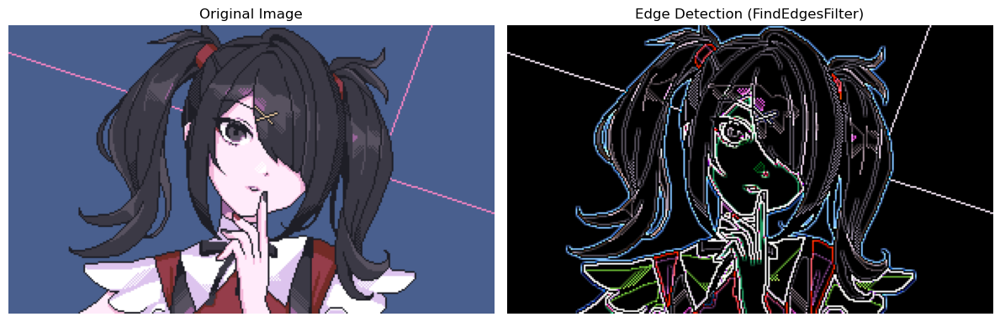

In [78]:
edge_filter = FindEdgesFilter()
src = cv2.imread("Ame.png", cv2.IMREAD_COLOR)
src_rgb = cv2.cvtColor(src, cv2.COLOR_BGR2RGB)

#Copy the image before applying the filter
edge_img = src.copy()
edge_filter.apply(src, edge_img)

#Convert for matplotlib
edge_rgb = cv2.cvtColor(edge_img, cv2.COLOR_BGR2RGB)

#results
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.imshow(src_rgb)
plt.title("Original Image")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(edge_rgb)
plt.title("Edge Detection (FindEdgesFilter)")
plt.axis("off")

plt.tight_layout()
plt.show()

**Analysis:** <br>
*The FindEdgeFilter class filtered the image in a way that it left out the outlines. This is how edge detection is done, it seems. What's interesting, however, is the different colors displayed of the different edges.*

Next, let's make a blur filter. Generally, for a blur effect, the weights should sum up to 1 and should be positive throughout the neighborhood. For example, we can take a simple average of the neighborhood as follows

In [80]:
class Blurfilter(VConvolutionFilter):
  """A blur filter with a 2-pixel radius"""

  def __init__(self):
    kernel = np.array([[0.04, 0.04, 0.04, 0.04, 0.04],
                       [0.04, 0.04, 0.04, 0.04, 0.04],
                       [0.04, 0.04, 0.04, 0.04, 0.04],
                       [0.04, 0.04, 0.04, 0.04, 0.04],
                       [0.04, 0.04, 0.04, 0.04, 0.04]])
    VConvolutionFilter.__init__(self, kernel)

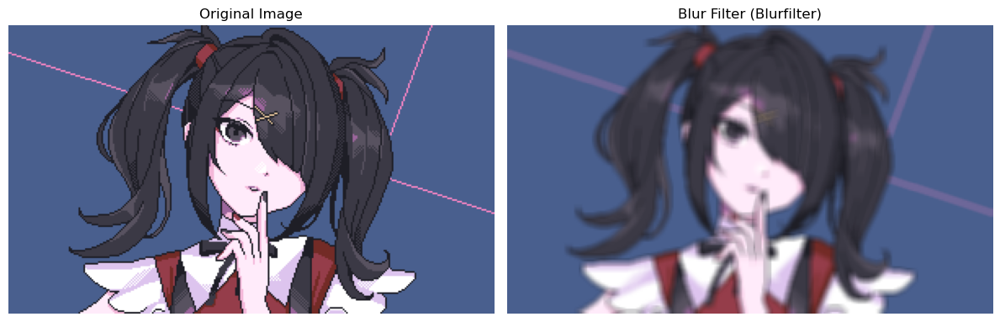

In [81]:
blur_filter = Blurfilter()
src = cv2.imread("Ame.png", cv2.IMREAD_COLOR)
src_rgb = cv2.cvtColor(src, cv2.COLOR_BGR2RGB)

#Copy the image before applying the filter
blur_fltr_img = src.copy()
blur_filter.apply(src, blur_fltr_img)

#Convert for matplotlib
blur_rgb = cv2.cvtColor(blur_fltr_img, cv2.COLOR_BGR2RGB)

#results
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.imshow(src_rgb)
plt.title("Original Image")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(blur_rgb)
plt.title("Blur Filter (Blurfilter)")
plt.axis("off")

plt.tight_layout()
plt.show()

#### **Run this class and demonstrate the output. Provide an analysis**

**Analysis:** <br>
*the Blurfilter class made the image blurry. 

Our sharpening, edge detection, and blur filters use kernels that are highly symmetric. Sometimes, though, kernels with less symmetry produce an interesting
effect. Let's consider a kernel that blurs on one side (with positive weights) and sharpens on the other (with negative weights). It will produce a ridged or embossed effect.

In [83]:
class EmbossFilter(VConvolutionFilter):
  """An emboss filter with a 1-pixel radius."""

  def __init__(self):
    kernel = np.array([[-2, -1, 0],
                       [-1, 1, 1],
                       [0, 1, 2]])
    VConvolutionFilter.__init__(self, kernel)

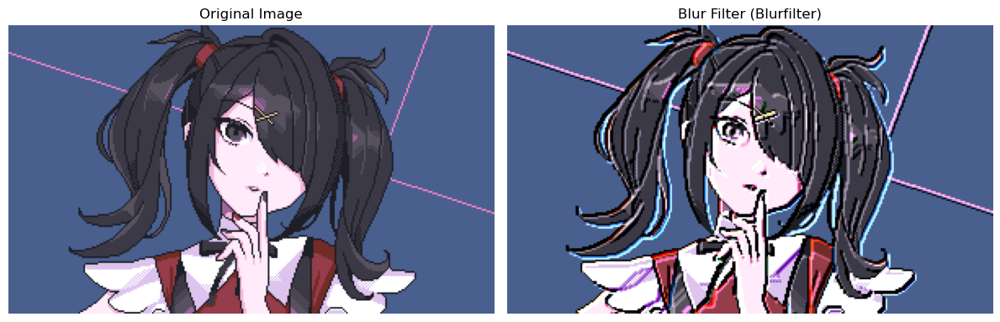

In [84]:
emboss_filter = EmbossFilter()
src = cv2.imread("Ame.png", cv2.IMREAD_COLOR)
src_rgb = cv2.cvtColor(src, cv2.COLOR_BGR2RGB)

#Copy the image before applying the filter
emboss_fltr_img = src.copy()
emboss_filter.apply(src, emboss_fltr_img)

#Convert for matplotlib
emboss_rgb = cv2.cvtColor(emboss_fltr_img, cv2.COLOR_BGR2RGB)

#results
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.imshow(src_rgb)
plt.title("Original Image")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(emboss_rgb)
plt.title("Blur Filter (Blurfilter)")
plt.axis("off")

plt.tight_layout()
plt.show()

#### **Run this class and demonstrate the output. Provide an analysis**

**Analysis:** <br>
*The EmbossFilter class made the colors in the image kind of "bleed", so these colors seem to be much more brighter, and along with that, the noise is clearly more visible*

### Edge Detection with Canny

OpenCV also offers a very handy function called Canny (after the algorithm's inventor, John F. Canny), which is very popular not only because of its  effectiveness, but also the simplicity of its implementation in an OpenCV program, as it is a one-liner:

In [99]:
import cv2
import numpy as np
img = cv2.imread('Ame.png', 0)
cv2.imwrite("cannyAme.png", cv2.Canny(img, 200, 300))

True

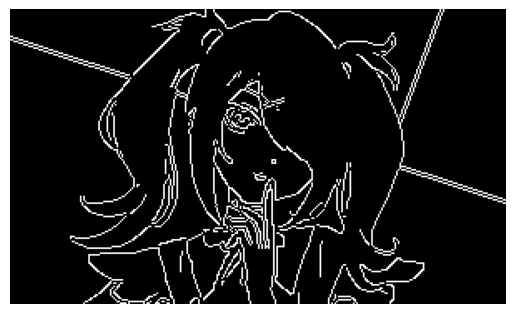

In [96]:
img_canny = cv2.imread('cannyAme.png')
img_canny = cv2.cvtColor(img_canny, cv2.COLOR_BGRA2RGBA)
plt.imshow(img_canny)
plt.axis("off")
plt.show()

In [93]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
"""For images with transparent background, do this"""
#Load image with alpha channel preserved
img = cv2.imread('Phrolova.png', cv2.IMREAD_UNCHANGED)
#Separate channels
b, g, r, a = cv2.split(img)
#Convert RGB channels to grayscale
gray = cv2.cvtColor(img[:, :, :3], cv2.COLOR_BGR2GRAY)
#Create a mask for visible (non-transparent) areas
mask = a > 0
#Zero out transparent regions in the grayscale image
gray[~mask] = 0
#Apply Canny only on visible regions
edges = cv2.Canny(gray, 200, 300)
#optional: Make transparent background for the result
canny_rgba = cv2.merge([edges, edges, edges, a])
#Save result
cv2.imwrite("canny_transparent.png", canny_rgba)
cv2.imwrite("cannyPhro.png", edges)

True

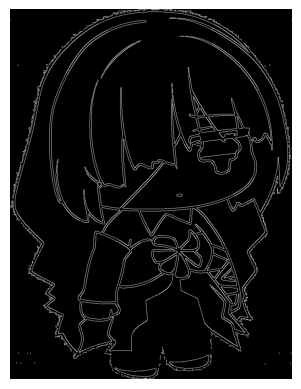

In [97]:
img_canny = cv2.cvtColor(edges, cv2.COLOR_BGRA2RGBA)
plt.imshow(img_canny)
plt.axis("off")
plt.show()

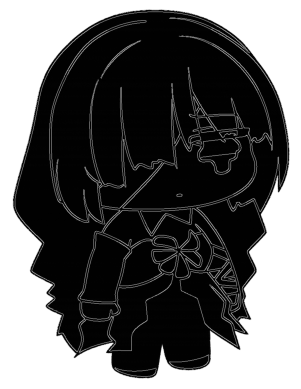

In [98]:
img_canny = cv2.cvtColor(canny_rgba, cv2.COLOR_BGRA2RGBA)
plt.imshow(img_canny)
plt.axis("off")
plt.show()

The Canny edge detection algorithm is quite complex but also interesting: it's a five-step process that denoises the image with a Gaussian filter, calculates gradients, applies non maximum suppression (NMS) on edges, a double threshold on all the
detected edges to eliminate false positives, and, lastly, analyzes all the edges and their connection to each other to keep the real edges and discard the weak ones.

**Try it on your own image, do you agree that it's an effective edge detection algorithm? Demonstrate your samples before making a conclusion**

*I think the Canny edge detection algorithm produces impressive results. As demonstrated above, the edges detected were quite accurate to the image's actual edges. One thing to note, however, is the amount of tedious work to do when the image in question has a transparent background, as some techniques such as channel splitting and masking have to be done first before using the edge detection algorithm.*

<hr/>

### Contour Detection

Another vital task in computer vision is contour detection, not only because of the obvious aspect of detecting contours of subjects contained in an image or video frame, but because of the derivative operations connected with identifying contours.

These operations are, namely, computing bounding polygons, approximating shapes, and generally calculating regions of interest, which considerably simplify interaction with image data because a rectangular region with NumPy is easily defined with an array slice. We will be using this technique a lot when exploring the concept of object detection (including faces) and object tracking.

In [24]:
import numpy as np
import cv2

img = np.zeros((200,200), dtype=np.uint8)
img[50:150, 50:150] = 255

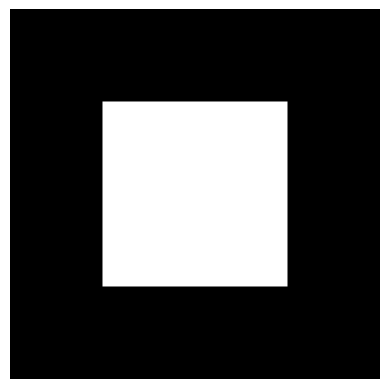

In [25]:
plt.imshow(img, cmap = "gray")
plt.axis("off")
plt.show()

In [28]:
ret, thresh = cv2.threshold(img, 127, 255, cv2.THRESH_BINARY)
print(ret)
print(thresh)

127.0
[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


In [29]:
contours, hierarchy = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
color = cv2.cvtColor(img, cv2.COLOR_GRAY2BGR)

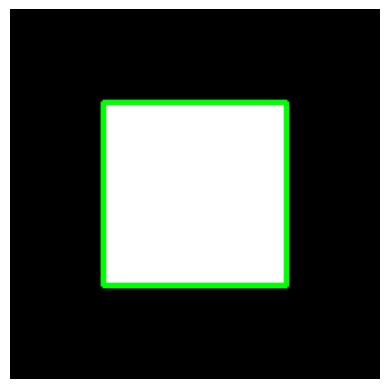

In [30]:
img = cv2.drawContours(color, contours, -1, (0, 255, 0), 2)
plt.imshow(cv2.cvtColor(color, cv2.COLOR_BGR2RGB))
plt.axis("off")
plt.show()

**What is indicated by the green box in the middle? Why are there no other green lines? Provided an analysis**

*The green box in the middle signifies the contour detected in the image. When applying thresholding and contour detection, OpenCV detects boundaries of connected white regions. In this case, since there's only one connected white region (the square), the contour is drawn.*

<hr/>

### Contours - bounding box, minimum area rectangle, and minimum enclosing circle

Finding the contours of a square is a simple task; irregular, skewed, and rotated shapes bring the best out of the cv2.findContours utility function of OpenCV. Consider this sample image:

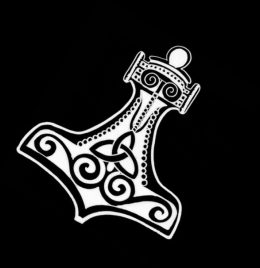

In a real-life application, we would be most interested in determining the bounding box of the subject, its minimum enclosing rectangle, and its circle. The cv2.findContours function in conjunction with a few other OpenCV utilities makes this very easy to accomplish:

In [13]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

img = cv2.pyrDown(cv2.imread("hammer.png", cv2.IMREAD_UNCHANGED))

ret, thresh = cv2.threshold(cv2.cvtColor(img.copy(), cv2.COLOR_BGR2GRAY), 127, 255, cv2.THRESH_BINARY)

In [14]:
contours, hier = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

In [15]:
for c in contours:
  # Find the bounding box coordinates
  x, y, w, h = cv2.boundingRect(c)
  cv2.rectangle(img, (x,y), (x+w, y+h), (0, 255, 0), 2)

  # Find minimum area
  rect = cv2.minAreaRect(c)

  # Calculate coordinates of the minimum area rectangle
  box = cv2.boxPoints(rect)

  # Normalize coordinates to integers
  box = np.intp(box)

  # Draw contours
  cv2.drawContours(img, [box], 0, (0, 0, 255), 3)

  # Calculate center and radius of minimu enclosing circle
  (x, y), radius = cv2.minEnclosingCircle(c)

  # Cast to integers
  center = (int(x), int(y))
  radius = int(radius)

  # Draw the circle
  img = cv2.circle(img, center, radius, (0, 255, 0), 2)

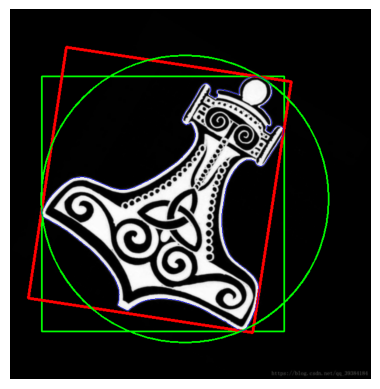

In [16]:
w_contour = cv2.drawContours(img, contours, -1, (255, 0, 0), 1)
plt.imshow(cv2.cvtColor(w_contour, cv2.COLOR_BGR2RGB))
plt.axis("off")
plt.show()

**Explain what has happened so far.**

*Four contours have been created pertaining to the sample image. The first contour encloses the figure's shape (highlighted as blue) by using the method earlier with the white box. Then, the second contour is a greed rectangle that is tangent with some points in the figure. Same for the red rectangle, and the green circle. The method in which these three contours were drawn was by calculating the minimum area of the rectangle or the minimum radius of the circle that can be used to surround the figure and then normalizing the the coordinates into integers.*

In [17]:
x, y, w, h = cv2.boundingRect(c)

This is a pretty straightforward conversion of contour information to the (x, y) coordinates, plus the height and width of the rectangle. Drawing this rectangle is an easy task and can be done using this code:

In [18]:
cv2.rectangle(img, (x,y), (x+w, y+h), (0, 255, 0), 2)

array([[[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       ...,

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]]], dtype=uint8)

Secondly, let's calculate the minimum area enclosing the subject:

In [20]:
rect = cv2.minAreaRect(c)
box = cv2.boxPoints(rect)
box = np.intp(box)

The mechanism used here is particularly interesting: OpenCV does not have a function to calculate the coordinates of the minimum rectangle vertexes directly from the contour information. Instead, we calculate the minimum rectangle area, and then
calculate the vertexes of this rectangle.

Note that the calculated vertexes are floats, but pixels are accessed with integers (you can't access a "portion" of a pixel), so we need to operate this conversion. Next, we draw the box, which gives us the perfect opportunity to introduce the cv2.drawContours function:

In [21]:
cv2.drawContours(img, [box], 0, (0, 0, 255), 3)

array([[[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       ...,

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]]], dtype=uint8)

Firstly, this function—like all drawing  functions—modifies the original image. Secondly, it takes an array of contours in its second parameter, so you can draw a number of contours in a single operation. Therefore, if you have a single set of points representing a contour polygon, you need to wrap these points into an array, exactly like we did with our box in the preceding example. The third parameter of this function specifies the index of the contours array that we want to draw: a value of -1 will draw all contours; otherwise, a contour at the specified index in the contours array (the second parameter) will be drawn.

Most drawing functions take the color of the drawing and its thickness as the last two parameters.

The last bounding contour we're going to examine is the minimum enclosing circle:

In [22]:
(x, y), radius = cv2.minEnclosingCircle(c)
center = (int(x), int(y))
radius = int(radius)
img = cv2.circle(img, center, radius, (0, 255, 0), 2)

The only peculiarity of the cv2.minEnclosingCircle function is that it returns a two-element tuple, of which the first element is a tuple itself, representing the coordinates of the circle's center, and the second element is the radius of this circle. After converting all these values to integers, drawing the circle is quite a trivial operation.

**Show the final image output and provide an analysis. Does it look similar to the image shown below?**

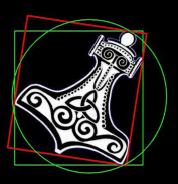

*It looks similar to the image shown above*

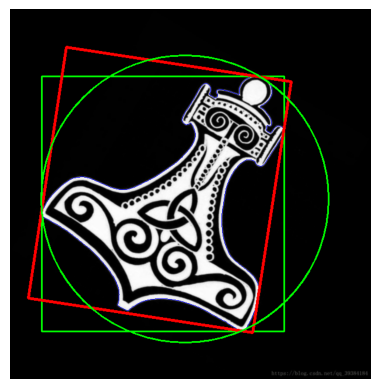

In [23]:
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.axis("off")
plt.show()

## 4. Supplementary Activity

For this section of the activity, you must have your favorite fictional character's picture ready.

Perform/Answer the following:

* Run all classes above meant to filter an image to your favorite character.

### Grayscale

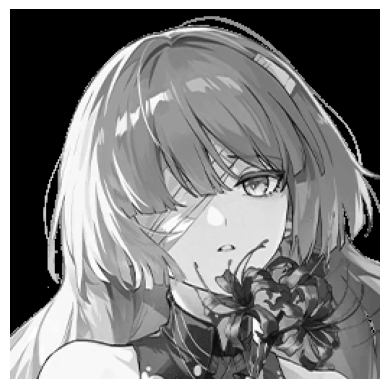

In [68]:
#Grayscale, image with transparent background

import numpy as np
import cv2
import matplotlib.pyplot as plt

#Load the image with transparency preserved
src = cv2.imread('Phrolova_1.png', cv2.IMREAD_UNCHANGED)

#Check if the image has alpha channel
if src.shape[2] == 4:
    #Separate channels
    b, g, r, a = cv2.split(src)
    #Convert only RGB channels to grayscale
    gray = cv2.cvtColor(src[:, :, :3], cv2.COLOR_BGR2GRAY)
    #Set fully transparent pixels to black in grayscale
    gray[a == 0] = 0
else:
    #Fallback for images without transparency
    gray = cv2.cvtColor(src, cv2.COLOR_BGRA2GRAY)

#Display the grayscale image properly
plt.imshow(gray, cmap='gray')
plt.axis("off")
plt.show()


### Apply median blur and Laplacian edge detection

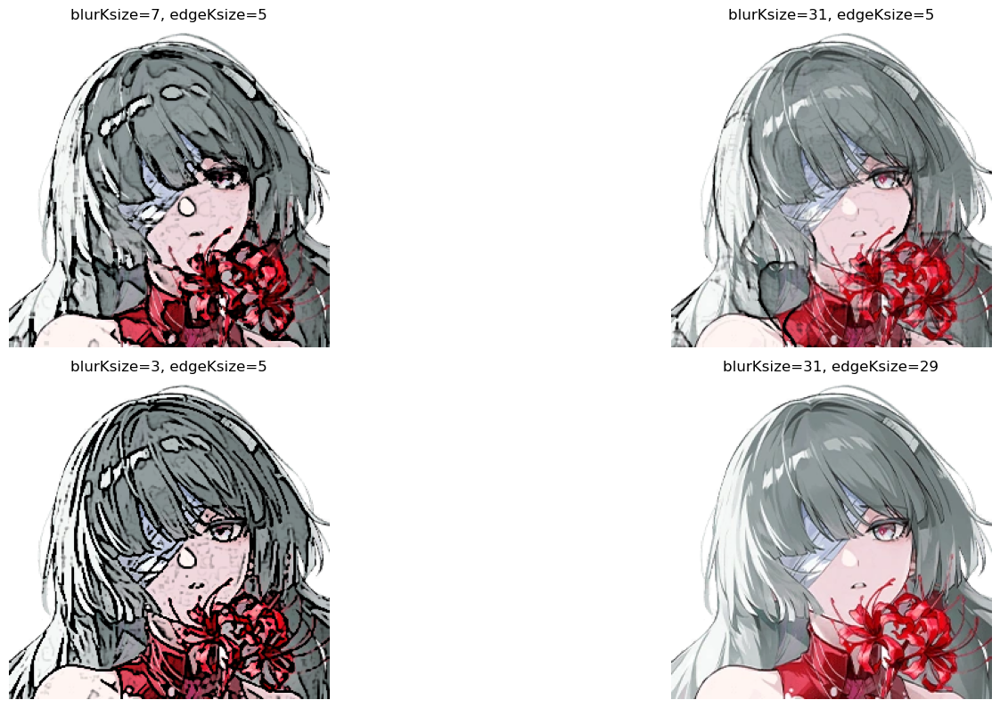

In [34]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def strokeEdges(src, blurKsize=7, edgeKsize=5):
    #Check if image has alpha channel
    has_alpha = src.shape[2] == 4
    #Separate alpha if present
    if has_alpha:
        bgr = src[:, :, :3]
        alpha = src[:, :, 3]
    else:
        bgr = src
        alpha = np.ones(bgr.shape[:2], dtype=np.uint8) * 255  # Fake opaque mask
    #Apply median blur if blurKsize >= 3
    if blurKsize >= 3:
        blurred = cv2.medianBlur(bgr, blurKsize)
        gray = cv2.cvtColor(blurred, cv2.COLOR_BGR2GRAY)
    else:
        gray = cv2.cvtColor(bgr, cv2.COLOR_BGR2GRAY)
    #Apply Laplacian edge detection
    cv2.Laplacian(gray, cv2.CV_8U, gray, ksize=edgeKsize)
    #Create normalized inverted alpha mask for edges
    normalizedInverseAlpha = (1.0 / 255) * (255 - gray)
    #Split BGR channels and apply mask
    channels = cv2.split(bgr)
    for channel in channels:
        channel[:] = channel * normalizedInverseAlpha
    #Merge back into BGR image
    bgr_result = cv2.merge(channels)
    #If original had alpha, restore it
    if has_alpha:
        final = cv2.merge([bgr_result[:, :, 0], bgr_result[:, :, 1], bgr_result[:, :, 2], alpha])
    else:
        final = bgr_result

    return final

#Load image with transparency preserved
src = cv2.imread("Phrolova_1.png", -1)

# Parameters for different blur & edge settings
params = [
    (7, 5, "blurKsize=7, edgeKsize=5"),      # Default
    (31, 5, "blurKsize=31, edgeKsize=5"),    # High blur
    (3, 5, "blurKsize=3, edgeKsize=5"),      # Low blur
    (31, 29, "blurKsize=31, edgeKsize=29"),  # High blur + high edge

]

# Display results
plt.figure(figsize=(15, 12))

for i, (blurKsize, edgeKsize, title) in enumerate(params, 1):
    result = strokeEdges(src, blurKsize=blurKsize, edgeKsize=edgeKsize)

    # Convert to RGBA for correct display
    if result.shape[2] == 4:
        result_rgb = cv2.cvtColor(result, cv2.COLOR_BGRA2RGBA)
    else:
        result_rgb = cv2.cvtColor(result, cv2.COLOR_BGR2RGB)

    plt.subplot(3, 2, i)
    plt.imshow(result_rgb)
    plt.axis("off")
    plt.title(title)

plt.tight_layout()
plt.show()


### Convolution Filters via Custom Kernels

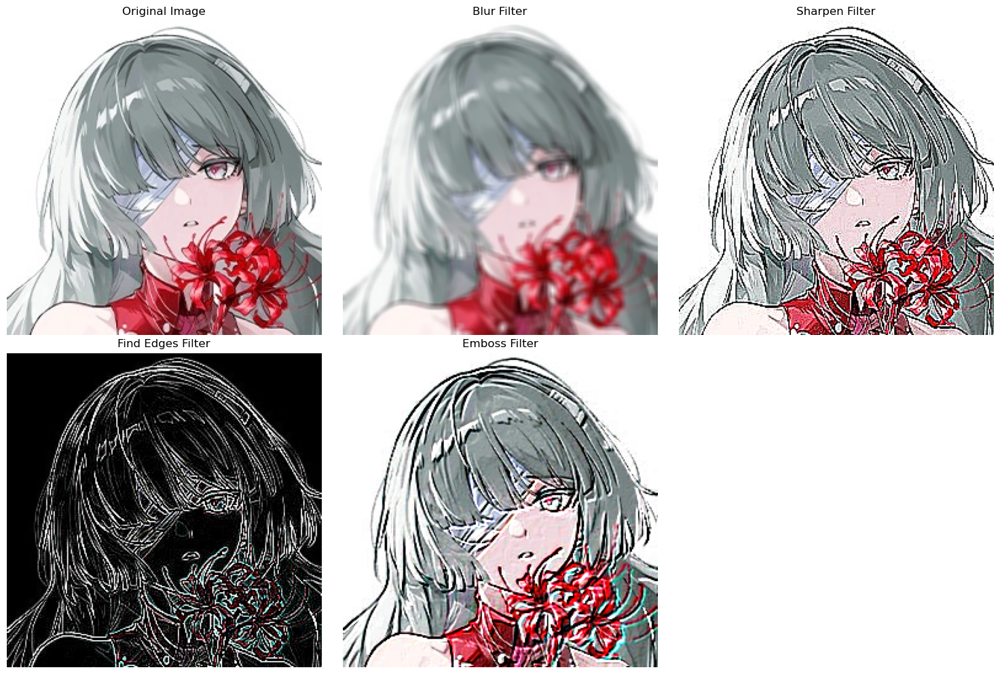

In [87]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

#Base Convolution Filter
class VConvolutionFilter(object):
    """A filter that applies a convolution to V (or all of BGR)."""
    def __init__(self, kernel):
        self._kernel = kernel

    def apply(self, src, dst):
        """Apply the filter with a BGR or gray source/destination"""
        cv2.filter2D(src, -1, self._kernel, dst)
#Sharpen Filter
class SharpenFilter(VConvolutionFilter):
    """A sharpen filter with a 1-pixel radius."""
    def __init__(self):
        kernel = np.array([[-1, -1, -1],
                           [-1,  9, -1],
                           [-1, -1, -1]])
        super().__init__(kernel)
#Edge Detection Filter
class FindEdgesFilter(VConvolutionFilter):
    """An edge-finding filter with a 1-pixel radius."""
    def __init__(self):
        kernel = np.array([[-1, -1, -1],
                           [-1,  8, -1],
                           [-1, -1, -1]])
        super().__init__(kernel)
#Blur Filter
class BlurFilter(VConvolutionFilter):
    """A blur filter with a 2-pixel radius."""
    def __init__(self):
        kernel = np.ones((5, 5), dtype=np.float32) * 0.04
        super().__init__(kernel)
#Emboss Filter
class EmbossFilter(VConvolutionFilter):
    """An emboss filter with a 1-pixel radius."""
    def __init__(self):
        kernel = np.array([[-2, -1,  0],
                           [-1,  1,  1],
                           [ 0,  1,  2]])
        super().__init__(kernel)
#Load Image
src = cv2.imread("Phrolova_1.jpg", cv2.IMREAD_COLOR)
src_rgb = cv2.cvtColor(src, cv2.COLOR_BGR2RGB)

#Create Filter Objects
sharpen_filter = SharpenFilter()
edges_filter = FindEdgesFilter()
blur_filter = BlurFilter()
emboss_filter = EmbossFilter()

#Apply Filters
def apply_filter(filter_obj, img):
    result = img.copy()
    filter_obj.apply(img, result)
    return cv2.cvtColor(result, cv2.COLOR_BGR2RGB)

sharpened_img = apply_filter(sharpen_filter, src)
edges_img = apply_filter(edges_filter, src)
blurred_img = apply_filter(blur_filter, src)
embossed_img = apply_filter(emboss_filter, src)

#Display All Results
plt.figure(figsize=(15, 10))

plt.subplot(2, 3, 1)
plt.imshow(src_rgb)
plt.title("Original Image")
plt.axis("off")

plt.subplot(2, 3, 2)
plt.imshow(blurred_img)
plt.title("Blur Filter")
plt.axis("off")

plt.subplot(2, 3, 3)
plt.imshow(sharpened_img)
plt.title("Sharpen Filter")
plt.axis("off")

plt.subplot(2, 3, 4)
plt.imshow(edges_img)
plt.title("Find Edges Filter")
plt.axis("off")

plt.subplot(2, 3, 5)
plt.imshow(embossed_img)
plt.title("Emboss Filter")
plt.axis("off")

plt.tight_layout()
plt.show()


* Use edge detection and contour detection on your fave character. Do they indicate the same?

*No, it seems that they do not indicate the same. Edge detection gets the differences between colors to define the edges, while contour detection gets the edges where there are same hues, but different intensities. For instance, it can detect shadows and highlights in the image.*

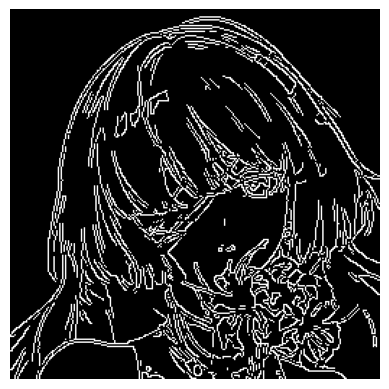

In [101]:
#Edge Detection
import cv2
import numpy as np
img = cv2.imread('Phrolova_1.jpg', 0)
cv2.imwrite("cannyPhrolova.png", cv2.Canny(img, 200, 300))
#show results
img_canny = cv2.imread('cannyPhrolova.png')
img_canny = cv2.cvtColor(img_canny, cv2.COLOR_BGRA2RGBA)
plt.imshow(img_canny)
plt.axis("off")
plt.show()

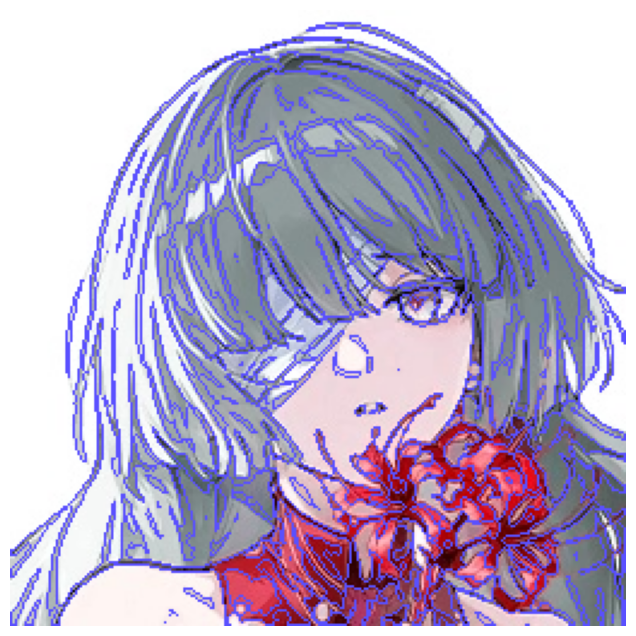

In [129]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
src = cv2.imread("Phrolova_1.jpg", cv2.IMREAD_COLOR)

#Apply adaptive thresholding for better contour detection
thresh = cv2.adaptiveThreshold(
    blurred, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
    cv2.THRESH_BINARY_INV, 11, 2
)

#Find contours
contours, hierarchy = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

#Copy the original image for drawing
contour_img = src.copy()

#Draw contours
cv2.drawContours(contour_img, contours, -1, (255, 80, 90), 1)

#Display result
plt.figure(figsize=(8, 8))
plt.imshow(cv2.cvtColor(contour_img, cv2.COLOR_BGR2RGB))
plt.axis("off")
plt.show()


* Modify your character's picture such that bounding boxes similar to what happens in the last procedure will be written on the image.

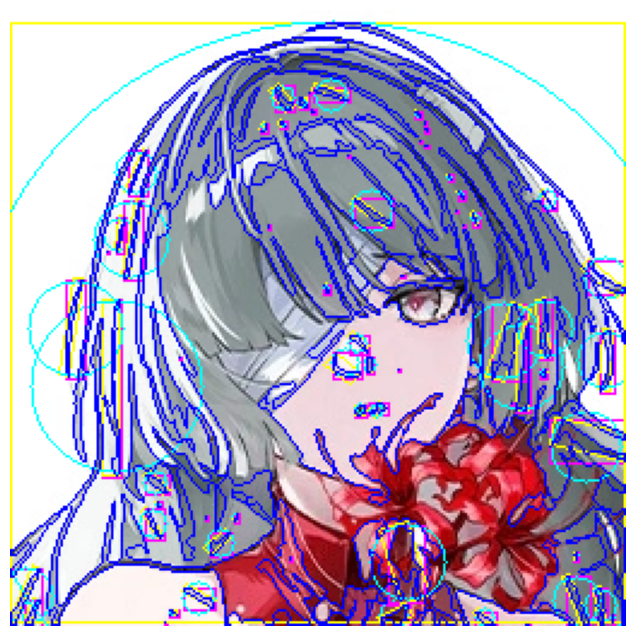

In [132]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
src = cv2.imread("Phrolova_1.jpg", cv2.IMREAD_COLOR)

#Apply adaptive thresholding
thresh = cv2.adaptiveThreshold(
    blurred, 
    255, 
    cv2.ADAPTIVE_THRESH_GAUSSIAN_C, 
    cv2.THRESH_BINARY_INV, 
    11, 2
)

#Find contours (external only for clean detection)
contours, hier = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# opy image for drawing
output = src.copy()

#Draw bounding boxes, min-area rects, and enclosing circles
for c in contours:
    # Bounding rectangle
    x, y, w, h = cv2.boundingRect(c)
    cv2.rectangle(output, (x, y), (x+w, y+h), (255, 0, 255), 1)

    #Minimum area rectangle
    rect = cv2.minAreaRect(c)
    box = cv2.boxPoints(rect)
    box = np.intp(box)
    cv2.drawContours(output, [box], 0, (0, 255, 255), 1)

    #Minimum enclosing circle
    (x, y), radius = cv2.minEnclosingCircle(c)
    center = (int(x), int(y))
    radius = int(radius)
    cv2.circle(output, center, radius, (255, 255, 0), 1)

#Draw all contours on the image
contour_img = cv2.drawContours(output, contours, -1, (255, 0, 0), 1)

#Display result
plt.figure(figsize=(8, 8))
plt.imshow(cv2.cvtColor(contour_img, cv2.COLOR_BGR2RGB))
plt.axis("off")
plt.show()


* Research on the benefits of using canny and contour detection. What happens to the image after edge detection? What happens when you apply contour straight after?

*Edge and contour detection are very useful for defining boundaries between objects in an image. This can be helpful in applications such as medical imaging, robotics, and image segmentation.*<br>
*After edge detection, the areas with large intensity changes within the image are detected. For instance, a black line with a white background will be detected via edge detection due to their stark difference in hue and intensity (one is bright, one is dark)."
References:<br>
https://how.dev/answers/edge-detection-vs-contour-detection-in-computer-vision <br>
https://blog.roboflow.com/edge-detection/


*Once you use contour detection to an image that has been applied with edge detection, the contour seems to be a bit more accurate. An example was demonstrated below.*

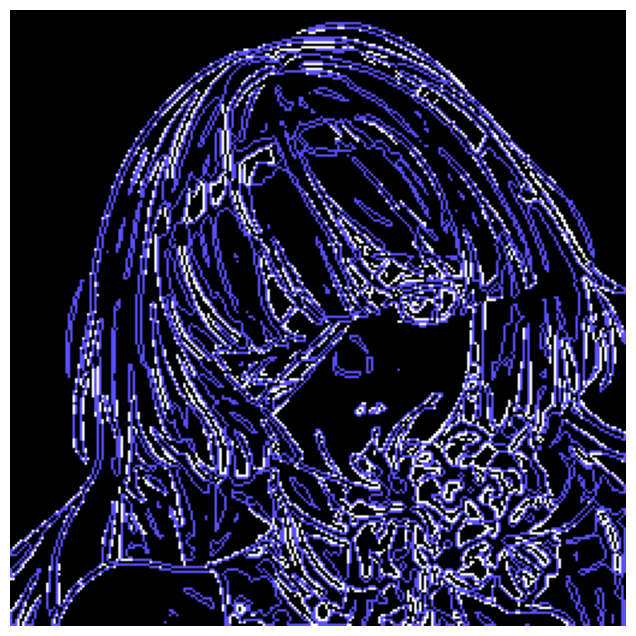

In [135]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
src = cv2.imread("cannyPhrolova.png", cv2.IMREAD_COLOR)

#Find contours
contours, hierarchy = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

#Copy the original image for drawing
contour_img = src.copy()

#Draw contours
cv2.drawContours(contour_img, contours, -1, (255, 80, 90), 1)

#Display result
plt.figure(figsize=(8, 8))
plt.imshow(cv2.cvtColor(contour_img, cv2.COLOR_BGR2RGB))
plt.axis("off")
plt.show()


## 5. Summary, Conclusions and Lessons Learned

In this actvity, I was able to learn about feature detection in images as well as applying filters on those images. While I'm a bit confused about the math behind convolution filters, I was able to grasp the basic concepts involving them, which can be applied to make different effects that can be applied to images. From what I understand, convolution is about multiplying a kernel or a matrix to an image's group of pixels, then getting the sum of that group of pixels, then applying that value to a single pixel of a new image. <br>

I'm already familiar with grayscaling, but this activity helped me understand why it is important in image processing, which is removing color details for easier analysis, when necessary.<br>

Finally, I was able to familiarize myself with edge and contour detection, as well as their usage applications and features. In contour detection, I learned that adding adaptinve thresholding helped a lot to get more accurate contours. Using those two simultaneously produces almost accurate contours too.


<hr/>

***Proprietary Clause***

*Property of the Technological Institute of the Philippines (T.I.P.). No part of the materials made and uploaded in this learning management system by T.I.P. may be copied, photographed, printed, reproduced, shared, transmitted, translated, or reduced to any electronic medium or machine-readable form, in whole or in part, without the prior consent of T.I.P.*